In [2]:
import os
import glob

import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'Malgun Gothic' # font 설정
matplotlib.rcParams['axes.unicode_minus'] = False # '-' 부호 인식 설정

import seaborn as sns

In [3]:
obs_data_list = glob.glob("./DATA/20230705_스시2_서울&시흥_1월관측_후처리자료/*csv") # observational data file list

# 바이살라 수집 데이터 분석

In [4]:
obs_data_list_vi = glob.glob("./DATA/20230705_스시2_서울&시흥_1월관측_후처리자료/*vai*csv") # observational data file list

In [5]:
obs_data_list_vi

['./DATA/20230705_스시2_서울&시흥_1월관측_후처리자료\\seoul_1_gangbyeon_vaisala_20230119_U.csv',
 './DATA/20230705_스시2_서울&시흥_1월관측_후처리자료\\seoul_2_naebu_vaisala_20230119_U.csv',
 './DATA/20230705_스시2_서울&시흥_1월관측_후처리자료\\seoul_3_dongbu_vaisala_20230119_U.csv']

In [6]:
# chech the columns of the vaisala data
for i in obs_data_list_vi:
    print(pd.read_csv(i).columns)

Index(['timestamp', 'longitude', 'latitude', 'relative_humidity',
       'surface_temperature', 'ice_layer_thickness', 'surface_state',
       'dew_point_temperature', 'water_layer_thickness',
       'frost_point_temperature', 'ambient_temperature', 'grip',
       'snow_layer_thickness'],
      dtype='object')
Index(['timestamp', 'longitude', 'latitude', 'relative_humidity',
       'surface_temperature', 'ice_layer_thickness', 'surface_state',
       'dew_point_temperature', 'water_layer_thickness',
       'frost_point_temperature', 'ambient_temperature', 'grip',
       'snow_layer_thickness'],
      dtype='object')
Index(['timestamp', 'longitude', 'latitude', 'relative_humidity',
       'surface_temperature', 'ice_layer_thickness', 'surface_state',
       'dew_point_temperature', 'water_layer_thickness',
       'frost_point_temperature', 'ambient_temperature', 'grip',
       'snow_layer_thickness'],
      dtype='object')


바이살라 데이터의 컬럼이름은 모두 일치하는 것을 확인

In [7]:
gangbyeon_vaisala_20230119_U_df = pd.read_csv(obs_data_list_vi[0])
naebu_vaisala_20230119_U_df = pd.read_csv(obs_data_list_vi[1])
dongbu_vaisala_20230119_U_df = pd.read_csv(obs_data_list_vi[2])

In [8]:
gangbyeon_vaisala_20230119_U_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31977 entries, 0 to 31976
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   timestamp                31977 non-null  object 
 1   longitude                31977 non-null  float64
 2   latitude                 31977 non-null  float64
 3   relative_humidity        31977 non-null  float64
 4   surface_temperature      31977 non-null  float64
 5   ice_layer_thickness      31977 non-null  float64
 6   surface_state            31977 non-null  object 
 7   dew_point_temperature    31977 non-null  float64
 8   water_layer_thickness    31977 non-null  float64
 9   frost_point_temperature  31977 non-null  float64
 10  ambient_temperature      31977 non-null  float64
 11  grip                     31977 non-null  float64
 12  snow_layer_thickness     31977 non-null  float64
dtypes: float64(11), object(2)
memory usage: 3.2+ MB


In [9]:
naebu_vaisala_20230119_U_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32264 entries, 0 to 32263
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   timestamp                32264 non-null  object 
 1   longitude                32264 non-null  float64
 2   latitude                 32264 non-null  float64
 3   relative_humidity        32264 non-null  float64
 4   surface_temperature      32264 non-null  float64
 5   ice_layer_thickness      32264 non-null  float64
 6   surface_state            32264 non-null  object 
 7   dew_point_temperature    32264 non-null  float64
 8   water_layer_thickness    32264 non-null  float64
 9   frost_point_temperature  32264 non-null  float64
 10  ambient_temperature      32264 non-null  float64
 11  grip                     32264 non-null  float64
 12  snow_layer_thickness     32264 non-null  float64
dtypes: float64(11), object(2)
memory usage: 3.2+ MB


In [10]:
dongbu_vaisala_20230119_U_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30588 entries, 0 to 30587
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   timestamp                30588 non-null  object 
 1   longitude                30588 non-null  float64
 2   latitude                 30588 non-null  float64
 3   relative_humidity        30588 non-null  float64
 4   surface_temperature      30588 non-null  float64
 5   ice_layer_thickness      30588 non-null  float64
 6   surface_state            30588 non-null  object 
 7   dew_point_temperature    30588 non-null  float64
 8   water_layer_thickness    30588 non-null  float64
 9   frost_point_temperature  30588 non-null  float64
 10  ambient_temperature      30588 non-null  float64
 11  grip                     30588 non-null  float64
 12  snow_layer_thickness     30588 non-null  float64
dtypes: float64(11), object(2)
memory usage: 3.0+ MB


In [11]:
gangbyeon_vaisala_20230119_U_df['timestamp'] = pd.to_datetime(gangbyeon_vaisala_20230119_U_df['timestamp'])

In [12]:
gangbyeon_vaisala_20230119_U_df

,timestamp,longitude,latitude,relative_humidity,surface_temperature,ice_layer_thickness,surface_state,dew_point_temperature,water_layer_thickness,frost_point_temperature,ambient_temperature,grip,snow_layer_thickness
0,2023-01-19 15:06:31.340,127.113716,37.556753,39.880001,7.190002,0.0,SurfaceState.DRY,-7.051202,0.011927,-6.248940,5.52,0.819894,0.0
1,2023-01-19 15:06:31.463,127.113711,37.556733,39.880001,7.269989,0.0,SurfaceState.DRY,-7.051202,0.011861,-6.248940,5.52,0.819898,0.0
2,2023-01-19 15:06:31.564,127.113707,37.556716,39.880001,7.269989,0.0,SurfaceState.DRY,-7.051202,0.011903,-6.248940,5.52,0.819896,0.0
3,2023-01-19 15:06:31.648,127.113704,37.556703,39.880001,7.269989,0.0,SurfaceState.DRY,-7.051202,0.012149,-6.248940,5.52,0.819881,0.0
4,2023-01-19 15:06:31.771,127.113699,37.556683,39.880001,7.190002,0.0,SurfaceState.DRY,-7.051202,0.012074,-6.248940,5.52,0.819886,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
31972,2023-01-19 15:59:45.731,126.863225,37.576482,35.230000,8.450012,0.0,SurfaceState.DRY,-7.947442,0.007376,-7.049549,6.31,0.820000,0.0
31973,2023-01-19 15:59:45.813,126.863220,37.576485,35.230000,8.450012,0.0,SurfaceState.DRY,-7.947442,0.006003,-7.049549,6.31,0.820000,0.0
31974,2023-01-19 15:59:45.935,126.863212,37.576490,35.230000,8.450012,0.0,SurfaceState.DRY,-7.947442,0.007468,-7.049549,6.31,0.820000,0.0
31975,2023-01-19 15:59:46.017,126.863208,37.576491,35.230000,8.450012,0.0,SurfaceState.DRY,-7.947442,0.009176,-7.049549,6.31,0.820000,0.0


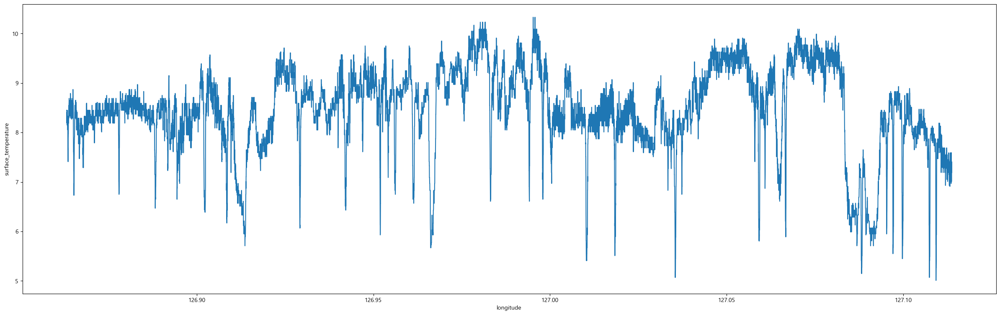

In [13]:
plt.figure(figsize=(30,9))
sns.lineplot(data = gangbyeon_vaisala_20230119_U_df , x = 'longitude',y= 'surface_temperature')
plt.show()

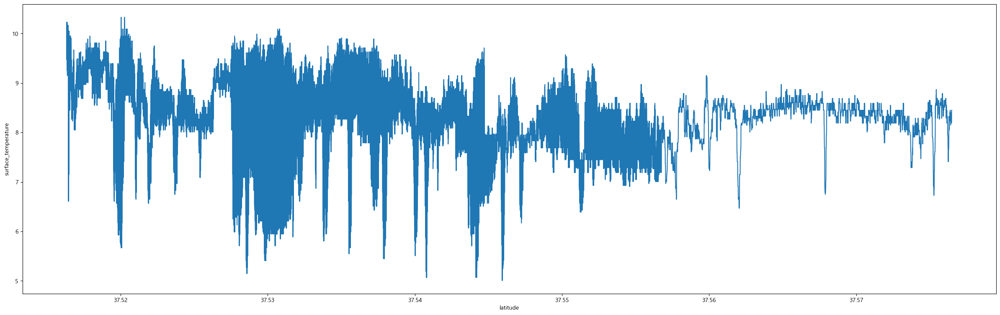

In [14]:
plt.figure(figsize=(30,9))
sns.lineplot(data = gangbyeon_vaisala_20230119_U_df , x = 'latitude',y= 'surface_temperature')
plt.show()

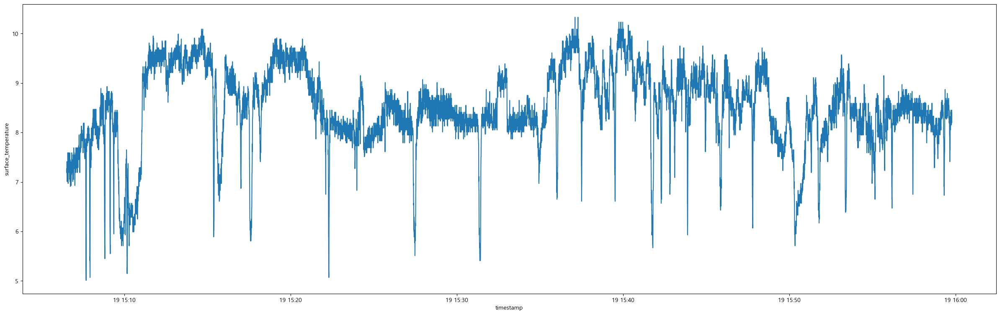

In [15]:
plt.figure(figsize=(30,9))
sns.lineplot(data = gangbyeon_vaisala_20230119_U_df , x = 'timestamp',y= 'surface_temperature')
plt.show()

In [16]:
import plotly.express as px
fig = px.line(gangbyeon_vaisala_20230119_U_df, x="timestamp", y="surface_temperature")
fig.show()


In [17]:
fig = px.scatter(naebu_vaisala_20230119_U_df, x="longitude", y="latitude",color="surface_temperature")
fig.show()


내부순환 도로의 결측은 터널과 터널 사이의 데이터 </br>
터널 입구부터 출구까지 점점 온도가 올라감

In [18]:
fig = px.scatter(gangbyeon_vaisala_20230119_U_df, x="longitude", y="latitude",color="surface_temperature")
fig.show()

강변 온도가 낮아지는 변곡점은 교량

In [21]:
fig = px.scatter(dongbu_vaisala_20230119_U_df, x="longitude", y="latitude",color="surface_temperature")
fig.show()

# 관측 데이터와 모델 데이터 병합 바이살라

In [22]:
from sklearn.neighbors import KDTree
from sklearn.metrics import mean_squared_error

In [82]:
# extract observational data information from file name
obs_data_list = glob.glob("./DATA/20230705_스시2_서울&시흥_1월관측_후처리자료/*csv") # observational data file list

#=================================================================================================================================== convert to function 
file_name = obs_data_list[0] # select one file from file list
file_info = file_name.split("\\")[-1].split("_") # split the name for information
obs_site = file_info[0] #  get observation site information
obs_road,obs_road_direction= file_info[-4], file_info[-1].split(".")[0]
year_month, year, month, day = file_info[-2][:6], file_info[-2][:4], file_info[-2][4:6], file_info[-2][6:8] # get time imformation


model_sites = ['jr','mg','org','ss','yc']
model_site = model_sites[0]
model_data_list = [glob.glob(f"./DATA/MODEL/{obs_site}/{model_site}/{year_month}/{day}/*csv")[0],glob.glob(f"./DATA/MODEL/{obs_site}/{model_site}/{year_month}/{int(day)-1}/*csv")[0]]

model_df_list = []
for model_file in model_data_list:
    model_df_indiv =  pd.read_csv(model_file,usecols = ['date_time','update_time','lon','lat','road_name','direction','road_temp'])
    cond1 = model_df_indiv['road_name'] == obs_road
    cond2 = model_df_indiv['direction'].str.startswith(obs_road_direction)
    model_df_indiv = model_df_indiv[cond1 & cond2]
    model_df_list.append(model_df_indiv)
model_df = pd.concat(model_df_list)

In [91]:
pd.read_csv(obs_data_list[0],usecols = ['timestamp','longitude','latitude','surface_temperature'])

,timestamp,longitude,latitude,surface_temperature
0,2023-01-19 15:06:31.340000,127.113716,37.556753,7.190002
1,2023-01-19 15:06:31.463000,127.113711,37.556733,7.269989
2,2023-01-19 15:06:31.564000,127.113707,37.556716,7.269989
3,2023-01-19 15:06:31.648000,127.113704,37.556703,7.269989
4,2023-01-19 15:06:31.771000,127.113699,37.556683,7.190002
...,...,...,...,...
31972,2023-01-19 15:59:45.731000,126.863225,37.576482,8.450012
31973,2023-01-19 15:59:45.813000,126.863220,37.576485,8.450012
31974,2023-01-19 15:59:45.935000,126.863212,37.576490,8.450012
31975,2023-01-19 15:59:46.017000,126.863208,37.576491,8.450012


In [87]:
model_df.date_time # 모델이 예측한 시간

0        2023-01-19 15:00
1        2023-01-19 15:00
2        2023-01-19 15:00
3        2023-01-19 15:00
4        2023-01-19 15:00
               ...       
87795    2023-01-19 15:00
87796    2023-01-19 15:00
87797    2023-01-19 15:00
87798    2023-01-19 15:00
87799    2023-01-19 15:00
Name: date_time, Length: 175600, dtype: object